In [1]:
#**************************************** Importing constants*****************************************#

from constants import *

#*****************************************************************************************************#
#***************************************** Importing modules *****************************************#
#*****************************************************************************************************#

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
from numpy import sin, exp, cos, pi, sqrt
from shapely.geometry import Point, Polygon
from descartes import PolygonPatch
import kwant
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import os
import timeit
import datetime
import dill
import copy
import sys

data_dir = os.path.dirname(os.getcwd()) + '/data/'


C:\ProgramData\Miniconda3\lib\site-packages\kwant\solvers\default.py:16: RuntimeWarning: MUMPS is not available, SciPy built-in solver will be used as a fallback. Performance can be very poor in this case.
  warnings.warn("MUMPS is not available, "


In [2]:
#*****************************************************************************************************#
#************************************ Create a TBG sample object *************************************#
#*****************************************************************************************************#

from create_sample import Timer, TBGSample

NL = 100 # 600 in our paper
NW = 24 # 120 in our paper
N_lead_to_sample = 2 # 5 in our paper
twist_angle_deg = 1.0501208797943464 # It does not need to be a commensurate angle (see notebook on the
                                     # calculation of the spectrum of twisted bilayer graphene) 
Nx, Ny = int(NL / 5), int(NW / 5) # Number of subdomains to break the sample into and improve efficiency.
                                  # We used int(NL / 5), int(NW / 5) in our paper
cutoff = 4 # cutoff after which the interlayer hopping is zero. We used 4 in our paper
N_domains = 3 # we have data for 3, 5 and 7 
polygons_ensemble_index = 0 # 0-20, run in each case and average for the ensemble
plot_fname = None # If not None it stores the plot in a file  

timer = Timer()

sample = TBGSample(NL, NW, N_lead_to_sample, twist_angle_deg, stacking='AA')
sample.N_domains = N_domains
sample.polygons_ensemble_index = polygons_ensemble_index
domains_polygons_fname = data_dir + f"polygon_ensembles/N_domains = {N_domains}/data"
sample.add_domains_polygons(domains_polygons_fname, polygons_ensemble_index)
timer.reset_timer(message='Timer: Creation of the uncoupled system: ')


sample.plot_system(plot_subregions = False, plot_fname = plot_fname, show_plot = True)
timer.reset_timer(message='Timer: Plotting the uncoupled system: ')


sample.break_sample(Nx, Ny, cutoff)
sample.add_interlayer_hoppings()
sample.finalize_system()

timer.print_timer(message='Timer: Coupling the layers and finalizing the system: ')


Timer: Creation of the uncoupled system:  0:00:00


C:\ProgramData\Miniconda3\lib\site-packages\kwant\_plotter.py:316: RuntimeWarning: divide by zero encountered in scalar divide
  return -self.zorder3d + vs[2].mean() / cz.ptp()


Timer: Plotting the uncoupled system:  0:00:09
Timer: Coupling the layers and finalizing the system:  0:00:56


In [3]:
#*****************************************************************************************************#
#*************************************** Load finalized system ***************************************#
#*****************************************************************************************************#


E0 = 0.004
dE = 0.014
N_en = 20
energies = list(np.linspace(E0, E0 + dE, N_en, endpoint = True))

conductance_matrices = []
timer = Timer()

smatrix = kwant.smatrix(sample.system, E0)
conductance_matrix = smatrix.conductance_matrix()
conductance_matrices.append(conductance_matrix)
timer.reset_timer(message='Timer: Calculating one conductance matrix: ')

for energy in energies[1:]:
    smatrix = kwant.smatrix(sample.system, energy)
    conductance_matrix = smatrix.conductance_matrix()
    conductance_matrices.append(conductance_matrix)
    
timer.print_timer(message='Timer: Calculating all conductance matrices: ')


Timer: Calculating one conductance matrix:  0:00:57
Timer: Calculating all conductance matrices:  0:18:39


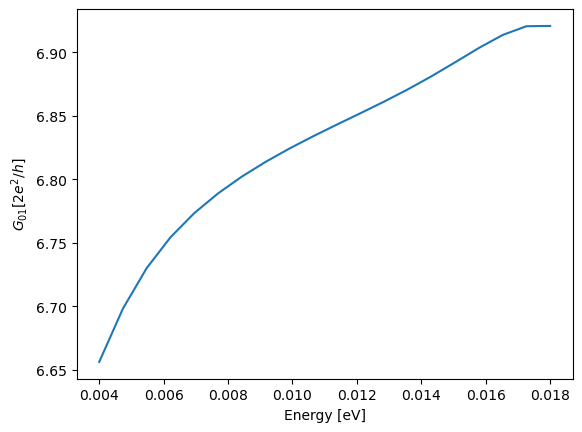

In [4]:
conductances = []
for _, conductance_matrix in enumerate(conductance_matrices):
    conductances.append(-conductance_matrix[0,1])
plt.plot(energies, conductances)
plt.xlabel('Energy [eV]')
plt.ylabel("$G_{01} [2 e^2 /  h]$")
plt.show()
plt.close()